In [2]:
import pandas as pd
# pd.options.plotting.backend = "plotly"
# import plotly.express as px
pd.set_option('display.max_rows',1000)
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import glob
from tqdm.notebook import tqdm
import math,statistics
from scipy.stats.mstats import winsorize
from scipy.spatial import distance
from analysis_module import *

In [2]:
import analysis_module
from importlib import reload
reload(analysis_module)
from analysis_module import *

In [42]:
# Taskwise analysis over all subjects' data
def subject_wise_Fixation(subjects, model):
    df = pd.DataFrame(columns = ["subb","trial_x","trial_y","acc","rms","std"])
    for subb in tqdm(subjects):
        fix_analyse = Fixation(subb, show = False)
        trial_x,trial_y,rms,std  = fix_analyse.parse_trials(model, 'pred_x', 'pred_y', pred_final= True, show = False)
        rms,std = get_fix_precision(rms,std)
        acc = get_fix_acc(fix_analyse.gt_points, trial_x,trial_y)
        df = df.append({"subb": subb, "trial_x": trial_x, "trial_y": trial_y, "acc": acc,"rms":rms ,"std":std}, ignore_index = True)
    df["mean_x"] = df.trial_x.apply( lambda x: { k:winsorize(v, limits=[0.1,0.1]).mean() for k,v in x.items() } )
    df["mean_y"] = df.trial_y.apply( lambda x: { k:winsorize(v, limits=[0.1,0.1]).mean() for k,v in x.items() } )
    return df

def subject_wise_SP(subjects, model):
    df = pd.DataFrame(columns = ["subb","trial_x","trial_y","onsets", "cmean","diff","cstd"])
    for subb in tqdm(subjects):
        SP_analyse = Smooth_Pursuit(subb, show=False)
        trial_x,trial_y,onsets = SP_analyse.parse_trials(model, show = False)
        cmean, diff, cstd = mean_angle_preds(trial_x,trial_y, SP_analyse.angles)
        
        df = df.append({"subb": subb, "trial_x": trial_x, "trial_y": trial_y, "onsets": onsets,"cmean":cmean ,"diff":diff, "cstd":cstd}, ignore_index = True)
    return df

def subject_wise_Zone(subjects, model):
    df = pd.DataFrame(columns = ["subb","trial_x","trial_y", "mean_x", "mean_y"])
    for subb in tqdm(subjects):
        zone_analyse = Zone_Classification(subb, show=False)
        trial_x,trial_y,mean_x,mean_y = zone_analyse.parse_trials(model, show = False)
#         cmean, diff, cstd = mean_angle_preds(trial_x,trial_y, SP_analyse.angles)
        df = df.append({"subb": subb, "trial_x": trial_x, "trial_y": trial_y, "mean_x": mean_x, "mean_y": mean_y}, ignore_index = True)
    return df

def subject_wise_FV(subjects, model):
    df = pd.DataFrame(columns = ["subb","trial_x","trial_y"])
    for subb in tqdm(subjects):
        FV_analyse = FreeView(subb, show=False)
        trial_x,trial_y= FV_analyse.parse_trials(model, show = False)
        df = df.append({"subb": subb, "trial_x": trial_x, "trial_y": trial_y}, ignore_index = True)
    return df

def subject_wise_blinks(subjects, model):
    df = pd.DataFrame(columns = ["subb","trial_latency", "blinks/trial", "avg_blinks/trial", "avg_latency"])
    for subb in tqdm(subjects):
        blink_analyse = Blink_Detect(subb, show=False)
        trial_latency = blink_analyse.parse_trials_stack(model, show = False)
        lengths = [len(t[~np.isnan(t)]) for t in trial_latency.values()]
        t = np.concatenate(list(trial_latency.values()))
        try:
            avg_bpt = winsorize(lengths, limits=[0.1,0.1]).mean()
            avg_lat = winsorize(t[~np.isnan(t)], limits=[0.1,0.1]).mean()/0.030
        except:
            avg_bpt = np.nan
            avg_lat = np.nan
        df = df.append({"subb": subb, "trial_latency": trial_latency, "blinks/trial":lengths ,"avg_blinks/trial": avg_bpt , "avg_latency": avg_lat}, ignore_index = True)
    return df

# Fixation

In [4]:
from analysis_fixation import *
#test
fix_analyse = Fixation("s8", show = False)
# trial_x,trial_y,rms,std  = fix_analyse.parse_trials(pred_path.MPII, 'pred_x', 'pred_y', pred_final= True, show = True)

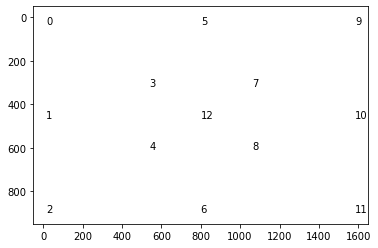

In [20]:
#Point sequence
pts = [(16, 16), (16, 450), (16, 884), (539, 305), (539, 595), (800, 16), (800, 884), (1061, 305), (1061, 595), (1584, 16), (1584, 450), (1584, 884), (800, 450)]
# plt.figure(figsize=(18,9))
plt.xlim(-50,1650)
plt.ylim(-50,950)
for i,pt in enumerate(pts):
    plt.text(pt[0],pt[1],str(i), va = 'center')
plt.gca().invert_yaxis()

### model-wise

In [7]:
#MPII
paths = glob.glob(os.path.join(pred_path.MPII.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
fix_df_mpii = subject_wise_Fixation(subjects, pred_path.MPII) 

 39%|████████████████▊                          | 16/41 [02:04<03:17,  7.89s/it]

s64 adding nan to pt 13 trial 12


 41%|█████████████████▊                         | 17/41 [02:09<02:49,  7.06s/it]

s9 adding nan to pt 11 trial 2


 88%|█████████████████████████████████████▊     | 36/41 [04:26<00:29,  5.92s/it]

s55 adding nan to pt 4 trial 3


100%|███████████████████████████████████████████| 41/41 [05:02<00:00,  7.39s/it]


In [8]:
#ETH
paths = glob.glob(os.path.join(pred_path.ETH.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
fix_df_eth = subject_wise_Fixation(subjects, pred_path.ETH) 

 59%|█████████████████████████▏                 | 24/41 [02:21<01:21,  4.81s/it]

s64 adding nan to pt 13 trial 12


100%|███████████████████████████████████████████| 41/41 [04:14<00:00,  6.21s/it]


In [11]:
fix_df = {"MPII":fix_df_mpii, "ETH":fix_df_eth}
model = "MPII"

[]

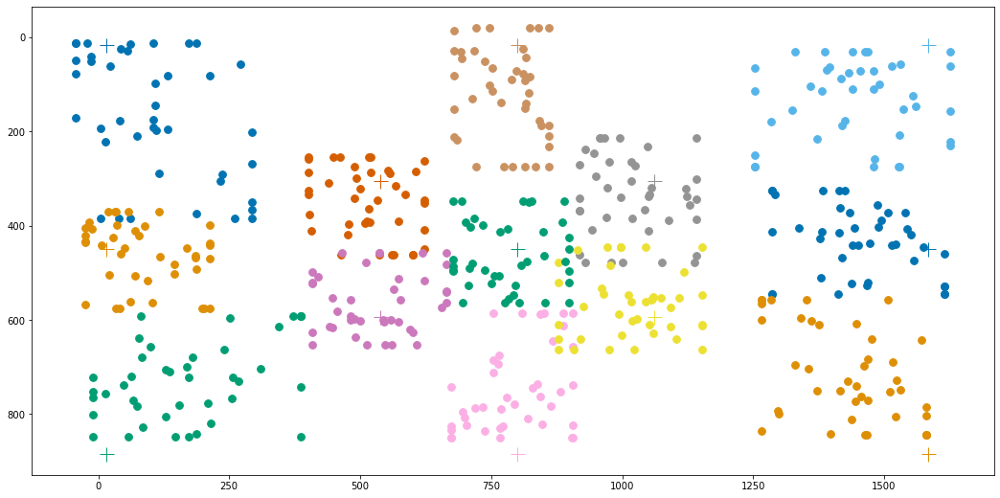

In [12]:
ax = fix_plot(fix_analyse.gt_points, fix_df[model], kind="all_subjects")
plt.gca().invert_yaxis()
ax.plot()

[]

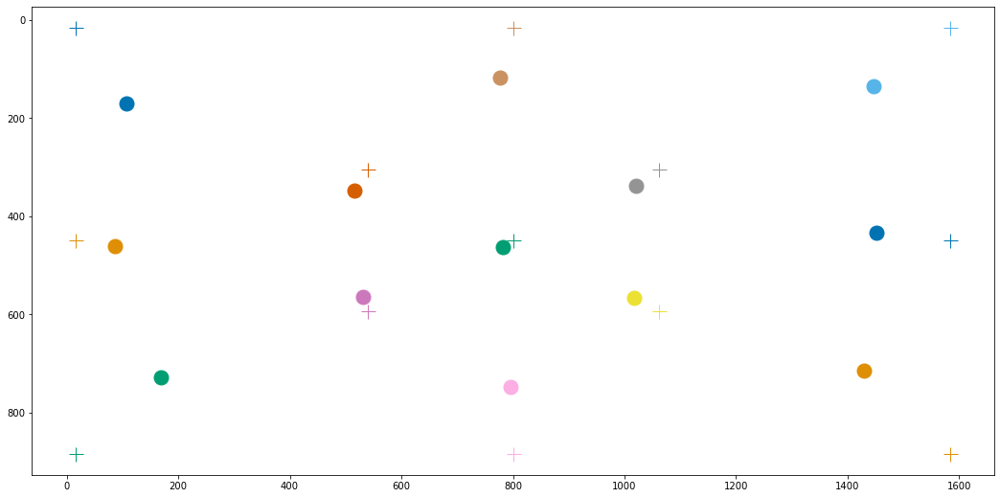

In [13]:
ax = fix_plot(fix_analyse.gt_points, fix_df[model])
plt.gca().invert_yaxis()
ax.plot()

[]

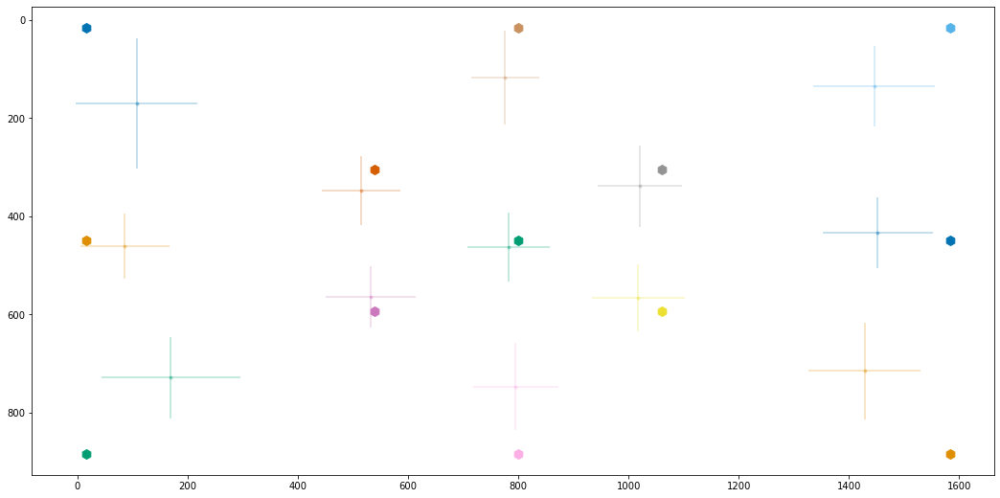

In [14]:
ax = fix_plot(fix_analyse.gt_points, fix_df[model], kind = 'err')
plt.gca().invert_yaxis()
ax.plot()

[]

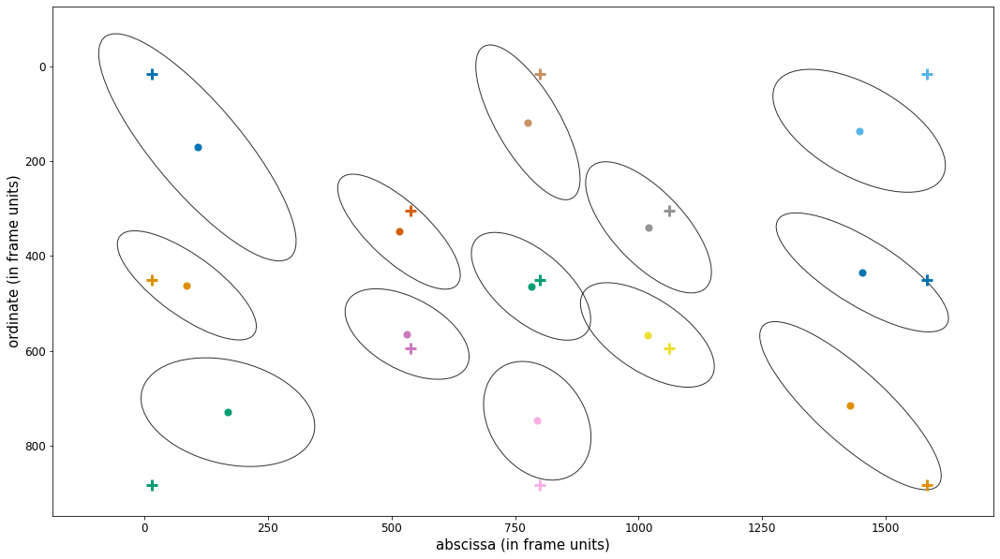

In [15]:
ax = fix_plot([(16, 16), (16, 450), (16, 884), (539, 305), (539, 595), (800, 16), (800, 884), (1061, 305), (1061, 595), (1584, 16), (1584, 450), (1584, 884), (800, 450)], fix_df[model],figsize=(18,10), kind = 'ellipse')
plt.gca().invert_yaxis()
ax.set_xlabel("abscissa (in frame units)", fontsize=15)
ax.set_ylabel("ordinate (in frame units)", fontsize=15)
ax.tick_params(axis='both', which='major', labelsize=12)
# ax.set_yticklabels(fontsize=14)
ax.plot()
# plt.savefig("fixation_41.png")

[]

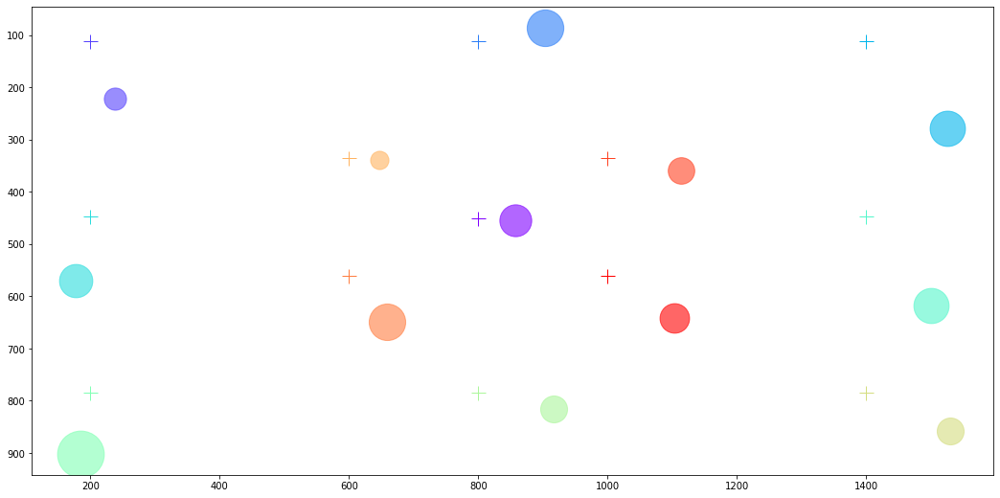

In [ ]:
# pallete = iter(sns.color_palette('colorblind',13))
# plt.figure(figsize=(18,9))
# for i in range(13):
#     gt = fix_analyse.gt_points[i]
#     c = next(pallete)
#     xs = winsorize(df['mean_x'].apply( lambda x: x[key+1] ), limits=[0.1,0.1]) 
#     ys = winsorize(df['mean_y'].apply( lambda y: y[key+1] ), limits=[0.1,0.1])
#     dist = [get_dist((x,y),(gt[0],gt[1])) for x,y in zip(xs,ys)]
#     size = statistics.stdev([get_dist((x,y),(X,Y)) for x,y in zip(trial_x[i],trial_y[i])])
#     plt.plot(X,Y,marker = "o", markersize = size, color = c, alpha = 0.6)
#     plt.plot(pt[0],pt[1],marker="+", markersize = 15, color = c)

# plt.gca().invert_yaxis()
# plt.plot()

In [16]:
#Metrics
model="ETH"
print(f" ACC: {winsorize(fix_df[model]['acc'], limits=[0.1,0.1]).mean()/54.05}")
print(f" RMS: {winsorize(fix_df[model]['rms'], limits=[0.1,0.1]).mean()/54.05}")
print(f" STD: {winsorize(fix_df[model]['std'], limits=[0.1,0.1]).mean()/54.05}")

 ACC: 3.054098656792065
 RMS: 1.807990992072669
 STD: 2.5513982541268168


### Between comparisons

In [9]:
def plot_err(dfs, col, labels):
    palette = sns.color_palette('colorblind',5)
    plt.figure(figsize=(12,8))
    err_l, err_h, mean = [],[], []
    for df, x_tick in zip(dfs, np.linspace(1,5,len(dfs))):
        plt.scatter([x_tick]*df.shape[0] ,df[col], color = palette[2], alpha = 0.3)
        mean.append(df[col].mean())
#         err.append(np.std(df[col], ddof=1)/np.sqrt(df.shape[0]))
        err_l.append(df[col].quantile(0.025)- df[col].mean())
        err_h.append(df[col].quantile(0.975))

    plt.errorbar(np.linspace(1.5,4.5,len(dfs)),[df[col].mean(), df[col].mean()], err, linestyle = 'none', color = palette[4], linewidth=2, marker = 'o')
    plt.xlim(0,6)
    plt.xticks(np.linspace(1,5,len(dfs)),labels)
    plt.ylim(-100,800)
    plt.show()

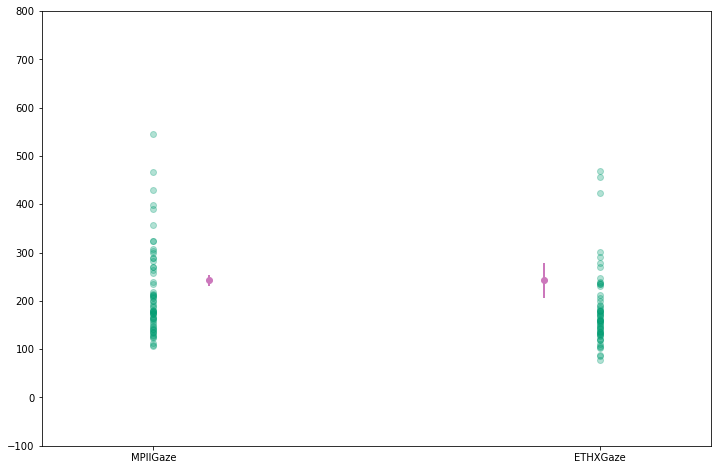

In [152]:
plot_err([df_mpii, df_eth],'acc', labels=["MPIIGaze","ETHXGaze"])

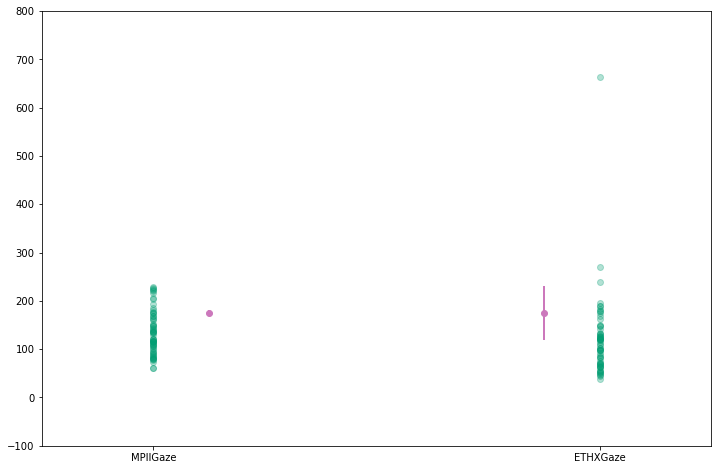

In [153]:
plot_err([df_mpii, df_eth],'rms', labels=["MPIIGaze","ETHXGaze"])

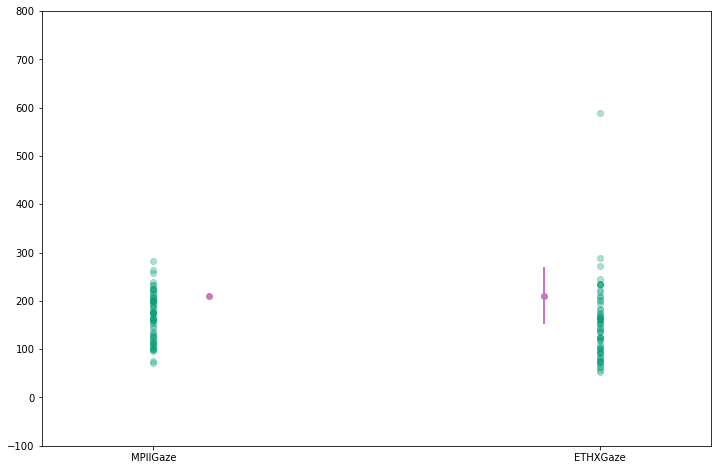

In [154]:
plot_err([df_mpii, df_eth],'std', labels=["MPIIGaze","ETHXGaze"])

# Smooth Pursuit

In [3]:
from analysis_smooth_pursuit import *
##test
SP_analyse = Smooth_Pursuit("s55", show=False)
# trial_x,trial_y,onsets = SP_analyse.parse_trials(pred_path.MPII, show = True)

In [19]:
# Plot angles 
# center = [800,450]
# from IPython.display import display, clear_output
# pts = []
# for angle in SP_analyse.angles:
#     X = center[0]+(450*np.cos(angle*np.pi/180))
#     Y = center[1]+(450*np.sin(angle*np.pi/180))
#     pts.append((X,Y))
#     plt.plot([center[0],X],[center[1],Y])
#     plt.xlim(0,1600)
#     plt.ylim(0,900)
#     plt.pause(0.6)
#     clear_output()

### Model-wise

In [4]:
#MPII
model = pred_path.MPII
paths = glob.glob(os.path.join(model.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
SP_df_mpii = subject_wise_SP(subjects, model)

 39%|████████████████▊                          | 16/41 [05:00<07:47, 18.70s/it]

Empty list cannot be interpolated
s64 adding nan to pt 60 trial 10
Empty list cannot be interpolated
s64 adding nan to pt 90 trial 11


 41%|█████████████████▊                         | 17/41 [05:16<07:13, 18.07s/it]

Empty list cannot be interpolated
s9 adding nan to pt 90 trial 3


 88%|█████████████████████████████████████▊     | 36/41 [10:48<01:22, 16.60s/it]

Empty list cannot be interpolated
s55 adding nan to pt 180 trial 5
Empty list cannot be interpolated
s55 adding nan to pt 150 trial 7
Empty list cannot be interpolated
s55 adding nan to pt 330 trial 8


100%|███████████████████████████████████████████| 41/41 [12:19<00:00, 18.04s/it]


In [81]:
#ETH
model = pred_path.ETH
paths = glob.glob(os.path.join(model.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
SP_df_eth = subject_wise_SP(subjects, model)

 32%|█████████████▋                             | 13/41 [03:41<07:55, 17.00s/it]

float division by zero
s9 adding nan to pt 90 trial 3


 44%|██████████████████▉                        | 18/41 [05:06<06:38, 17.35s/it]

Empty list cannot be interpolated
s55 adding nan to pt 210 trial 3
Empty list cannot be interpolated
s55 adding nan to pt 300 trial 4
Empty list cannot be interpolated
s55 adding nan to pt 180 trial 5
Empty list cannot be interpolated
s55 adding nan to pt 90 trial 6
Empty list cannot be interpolated
s55 adding nan to pt 150 trial 7
Empty list cannot be interpolated
s55 adding nan to pt 330 trial 8


 59%|█████████████████████████▏                 | 24/41 [06:51<04:53, 17.28s/it]

Empty list cannot be interpolated
s64 adding nan to pt 60 trial 10
Empty list cannot be interpolated
s64 adding nan to pt 90 trial 11


100%|███████████████████████████████████████████| 41/41 [12:13<00:00, 17.88s/it]


In [22]:
#FAZE
model = pred_path.FAZE
paths = glob.glob(os.path.join(model.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
SP_df_faze = subject_wise(subjects, model)

0it [00:00, ?it/s]


In [165]:
SP_df = {pred_path.MPII: SP_df_mpii, pred_path.ETH: SP_df_eth}
model = pred_path.ETH #select model for plots/analysis

In [174]:
SP_cmeans = SP_df[model].cmean.apply(pd.Series)
SP_diffs = SP_df[model]['diff'].apply(pd.Series)
SP_cstds = SP_df[model].cstd.apply(pd.Series)
SP_onsets = SP_df[model].onsets.apply(pd.Series)

In [175]:
diff_mean = {}
onset_mean = {}
for c in SP_cmeans.columns:
    SP_diffs[SP_diffs>180] = (SP_diffs[SP_diffs>180] - 360)
    diff_mean[c] = winsorize(SP_diffs[c], limits=[0.1,0.1]).mean()
    onset_mean[c] = winsorize(pd.to_numeric(SP_onsets[c].explode(ignore_index=True), errors='coerce').dropna(), limits=[0.1,0.1]).mean()
    
print("Mean diff:", winsorize([v for v in diff_mean.values()], limits=[0.1,0.1]).mean())
print("Mean Onset:", winsorize([v for v in onset_mean.values()], limits=[0.1,0.1]).mean())

Mean diff: 8.891393210108793
Mean Onset: 297.6160951072454


In [155]:
#cmeans 
win_sub_cmean = {}
win_sub_cse = {}
win_sub_025 = {}
win_sub_975 = {}
for col in SP_cmeans.columns:
    win_means = circ_winsorize(SP_cmeans[col],col)
    win_sub_cmean[col] = cim(win_means, high=360, low=0) #winsorize circular mean
    if col==0 and win_sub_cmean[col]>180:
        win_sub_cmean[col] = win_sub_cmean[col] - 360
    win_sub_cse[col] = cis(win_means, high=360, low=0)/math.sqrt(SP_cmeans.shape[0]) #winsorize circular std
    
    win_means = np.array([x-360 if x-col > 180 else x for x in win_means])
    win_sub_025[col] = win_sub_cmean[col] - np.quantile(win_means, 0.025)
    win_sub_975[col] = np.quantile(win_means, 0.975) - win_sub_cmean[col]

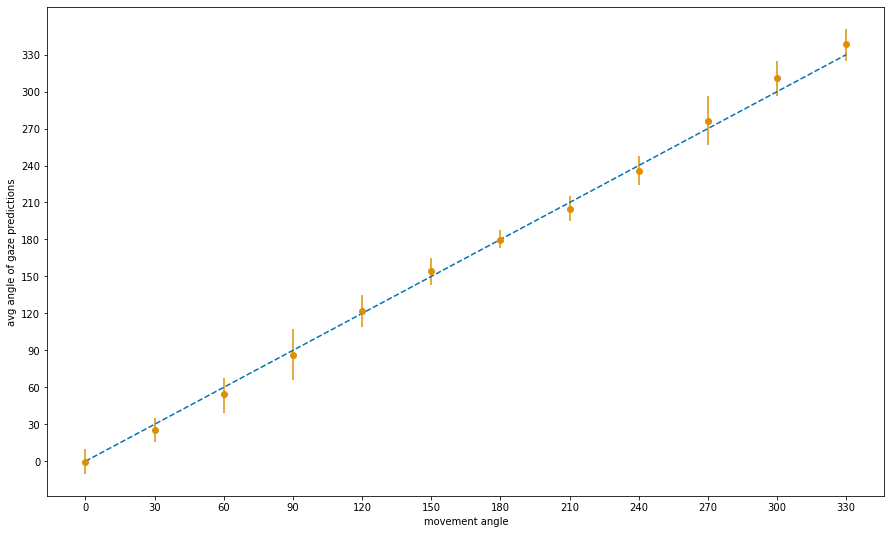

In [151]:
plt.figure(figsize=(15,9))
palette = iter(sns.color_palette('colorblind',12))
plt.plot([0,330],[0,330],linestyle="--", color = next(palette))

#Confidence interval for error bars
plt.errorbar(SP_analyse.angles,win_sub_cmean.values(), yerr = [list(win_sub_025.values()), list(win_sub_975.values())], linestyle = "None", marker="o", color = next(palette))

plt.xticks(SP_analyse.angles)
plt.yticks(SP_analyse.angles)
plt.xlabel("movement angle")
plt.ylabel("avg angle of gaze predictions")
plt.show()

In [153]:
cmean_eth = win_sub_cmean
cse_eth = win_sub_cse

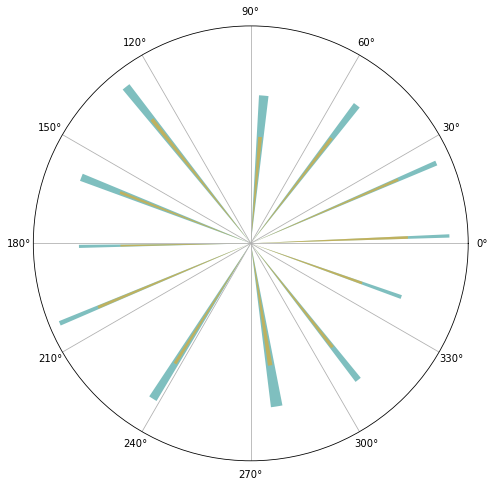

In [159]:
# ALL three models?
plt.figure(figsize=(8,8))
N = len(win_sub_cmean)
theta = [math.radians(i) for i in list(win_sub_cmean.values())] #np.linspace(0.0, 2 * np.pi, N, endpoint=False)
radii = np.random.uniform(low=7, high=10, size=N)
# width = np.pi / 32 * np.fromiter(win_sub_cse.values(), float)
width = [math.radians(i) for i in list(win_sub_cse.values())]
# colors = sns.color_palette("colorblind",len(win_sub_cmean))

ax = plt.subplot(projection='polar')
ax.bar(theta, radii, width=width, bottom=0.0, color="teal", alpha=0.5)
ax.set_rticks([])
ax.set_xticks([math.radians(i) for i in SP_analyse.angles])
# plt.show()

theta_eth = [math.radians(i) for i in list(cmean_eth.values())] #np.linspace(0.0, 2 * np.pi, N, endpoint=False)
width = [math.radians(i) for i in list(cse_eth.values())]

# ax = plt.subplot(projection='polar')
ax.bar(theta, radii-2, width=width, bottom=0.0, color="orange", alpha=0.5)
ax.set_rticks([])
ax.set_xticks([math.radians(i) for i in SP_analyse.angles])
plt.show()

# Zone Classification

In [24]:
from analysis_zone import *
from sklearn import metrics

In [6]:
def plot_zone(grid_size):
    plt.xlim(0,1600)
    plt.ylim(0,900)
    plt.xticks([(i+1)*1600//grid_size[0] for i in range(grid_size[0])])
    plt.yticks([(i+1)*900//grid_size[1] for i in range(grid_size[1])])
    plt.grid("both")
    plt.gca().invert_yaxis()

# plot_zone((4,4))

In [18]:
#test
zone_analyze = Zone_Classification("s8", show=True)
# trial_x,trial_y = zone_analyze.parse_trials(pred_path.MPII)

did_leave_fullscreen                                                  0.0
FrameEnd                                                  1635887817914.0
FrameStart                                                1635887788015.0
iteration                                                            18.0
pos_hide_time           "times=1635887787968;1635887789531;16358877912...
pos_update_time         "times=1635887787968;1635887789728;16358877914...
recordZone                 blockNr_13_taskNr_12_trialNr_1_recordZone.webm
RecStart                                                              5.0
RecStop                                                           28773.0
seq                                15;10;13;8;5;16;1;14;12;6;4;3;2;7;11;9
Name: 14, dtype: object
sp_df summary 
 None


## Model wise

In [20]:
#MPII
model = pred_path.MPII
paths = glob.glob(os.path.join(model.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
Zone_df_mpii = subject_wise_Zone(subjects, model)

 41%|█████████████████▊                         | 17/41 [01:11<01:29,  3.72s/it]

s9 adding nan to zone 10 trial 7


100%|███████████████████████████████████████████| 41/41 [02:43<00:00,  3.99s/it]


In [66]:
#ETH
model = pred_path.ETH
paths = glob.glob(os.path.join(model.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
Zone_df_eth = subject_wise_Zone(subjects, model)

 32%|█████████████▋                             | 13/41 [00:49<01:26,  3.11s/it]

s9 adding nan to zone 10 trial 7


 44%|██████████████████▉                        | 18/41 [01:13<01:33,  4.07s/it]


KeyboardInterrupt: 

In [22]:
model = pred_path.MPII #Select model
Zone_df = {pred_path.MPII: Zone_df_mpii, pred_path.ETH: Zone_df_eth}

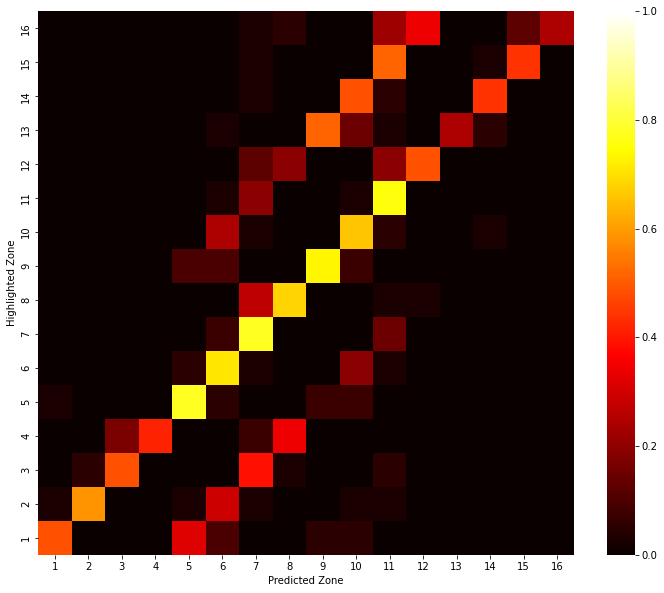

In [25]:
y_pred, y_true = [],[]
for i,row in Zone_df[model].iterrows():
    for k in range(1,17):
        y_pred.append(get_zone(row.mean_x[k], row.mean_y[k], (4,4))+1)
        y_true.append(k)

conf_matrix = metrics.confusion_matrix(y_true,y_pred)
conf_matrix = (conf_matrix/Zone_df[model].shape[0])
plt.figure(figsize=(12,10))
sns.heatmap(conf_matrix, xticklabels=range(1,17), yticklabels=range(1,17), cmap = "hot", vmin = 0, vmax= 1)
plt.xlabel("Predicted Zone")
plt.ylabel("Highlighted Zone")
plt.gca().invert_yaxis()

In [26]:
zone_pred = np.argmax(conf_matrix,axis=1)+1
metrics.accuracy_score(np.arange(1,17),zone_pred)*100

75.0

<AxesSubplot:>

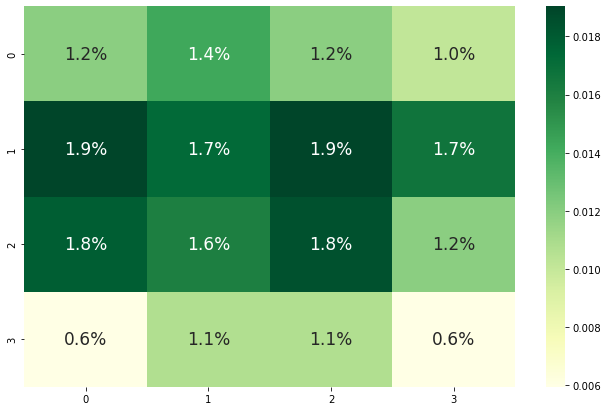

In [27]:
temp = (np.diagonal(conf_matrix)/41).reshape(4,4)
plt.figure(figsize=(11,7))
sns.heatmap(temp, cmap="YlGn", annot=True, fmt=".1%", annot_kws={"fontsize":17})

In [28]:
np.sum(np.array(y_true) == np.array(y_pred))/len(y_true)

0.5579268292682927

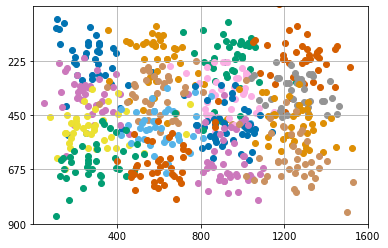

In [29]:
pallete = iter(sns.color_palette("colorblind", 16))
mx = Zone_df[model].mean_x.apply(pd.Series)
my = Zone_df[model].mean_y.apply(pd.Series)
plot_zone((4,4))
for zone in range(1,17):
    color = next(pallete)
    plt.scatter(mx[zone],my[zone],marker="o",color = color)
#     plt.show()
#     print("Zone {} : {}/10".format(zone,c))
    
# print("Avg: ",avg/160)

In [30]:
win_sub_x = Zone_df[model].mean_x.apply(pd.Series).apply(lambda x: winsorize(x, limits=[0.1,0.1]).mean(), axis=0)
win_sub_y = Zone_df[model].mean_y.apply(pd.Series).apply(lambda x: winsorize(x, limits=[0.1,0.1]).mean(), axis=0)

accuracy: 11/16 = 68.75%


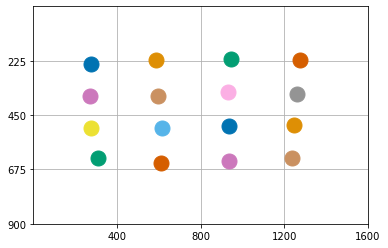

accuracy: 16/16 = 100.00%


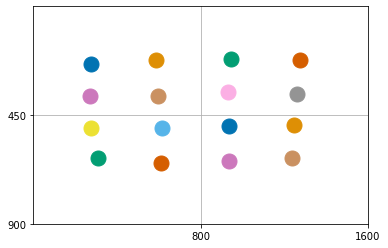

accuracy: 16/16 = 100.00%


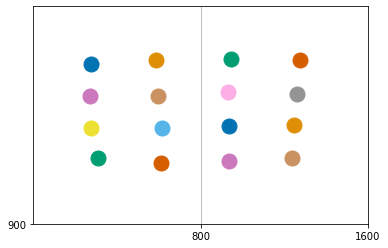

accuracy: 16/16 = 100.00%


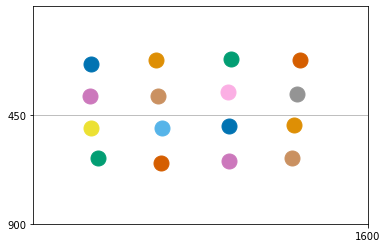

In [31]:
# fig,axes = plt.subplots(2,2, figsize=(11,8))
pallete = iter(sns.color_palette("colorblind",16))
c=0
plot_zone((4,4))
for z in range(1,17):
    plt.plot(win_sub_x[z],win_sub_y[z], marker="o", markersize = 15, color = next(pallete))
    if get_zone(win_sub_x[z],win_sub_y[z], (4,4)) == z-1:
        c+=1
print("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))
plt.show()

pallete = iter(sns.color_palette("colorblind",16))
c=0
gt = {0:[1,2,5,6],1:[3,4,7,8],2:[9,10,13,14],3:[11,12,15,16]}
plot_zone((2,2))
for z in range(1,17):
    plt.plot(win_sub_x[z],win_sub_y[z], marker = "o", markersize = 15, color = next(pallete))
    c = c + ( 1 if z in gt[get_zone(win_sub_x[z],win_sub_y[z],(2,2))]  else 0 )
print("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))
plt.show()

pallete = iter(sns.color_palette("colorblind",16))
c=0
gt = {0:[1,2,5,6,9,10,13,14],1:[3,4,7,8,11,12,15,16]}
plot_zone((2,1))
for z in range(1,17):
    plt.plot(win_sub_x[z],win_sub_y[z], marker = "o", markersize = 15, color = next(pallete))
    c = c + ( 1 if z in gt[get_zone(win_sub_x[z],win_sub_y[z],(2,1))] else 0 )
print("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))
plt.show()

pallete = iter(sns.color_palette("colorblind",16))
c=0
gt = {0:[1,2,5,6,3,4,7,8],1:[9,10,13,14,11,12,15,16]}
plot_zone((1,2))
for z in range(1,17):
    plt.plot(win_sub_x[z],win_sub_y[z], marker = "o", markersize = 15, color = next(pallete))
    c = c + ( 1 if z in gt[get_zone(win_sub_x[z],win_sub_y[z],(1,2))//2] else 0 )
print("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))

# FreeView

In [21]:
reload(analysis_freeview)
from analysis_freeview import *

In [19]:
#test
FV_analyse = FreeView( "s8", show=False)
# trial_x, trial_y = FV_analyse.parse_trials(pred_path.MPII, analyse_blinks=False)

In [10]:
model = pred_path.MPII
paths = glob.glob(os.path.join(model.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
FV_df_mpii = subject_wise_FV(subjects,model)

100%|███████████████████████████████████████████| 41/41 [00:53<00:00,  1.30s/it]


In [4]:
model = pred_path.ETH
paths = glob.glob(os.path.join(model.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
FV_df_eth = subject_wise_FV(subjects,model)

100%|███████████████████████████████████████████| 41/41 [00:52<00:00,  1.27s/it]


In [24]:
FV_df = {pred_path.MPII:FV_df_mpii, pred_path.ETH: FV_df_eth}
model = pred_path.MPII #Select_model

Trial_Id 7 image name i117772445


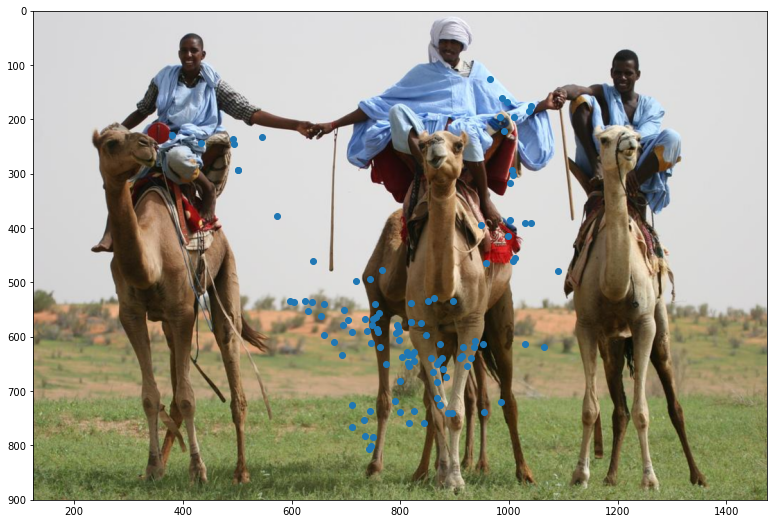

In [12]:
plot_one_subject(7,FV_df[model].iloc[7].trial_x[2],FV_df_mpii.iloc[7].trial_y[2])
plt.gca().invert_yaxis()

Trial_Id 1 image name i05june05_static_street_boston_p1010806


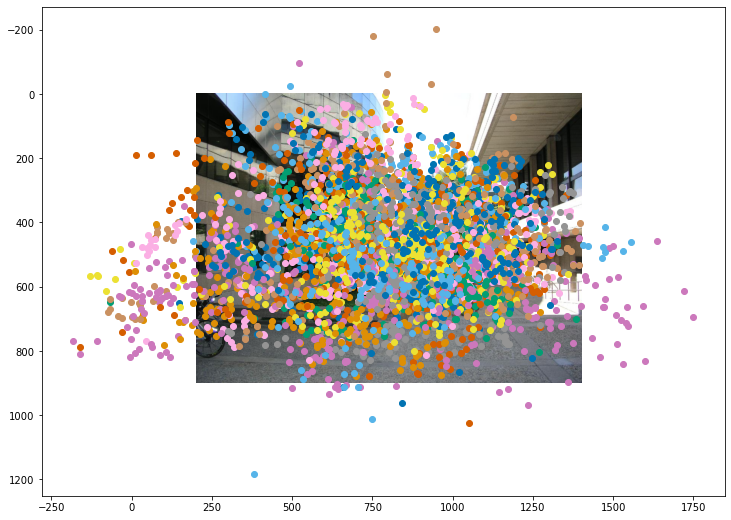

Trial_Id 2 image name i102423191


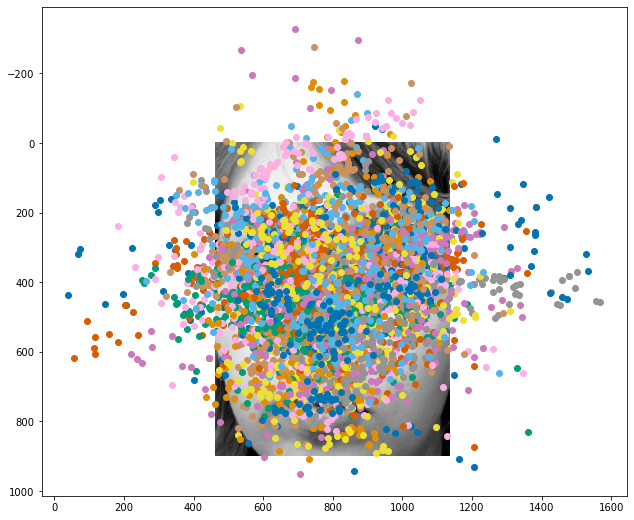

Trial_Id 3 image name i110996888


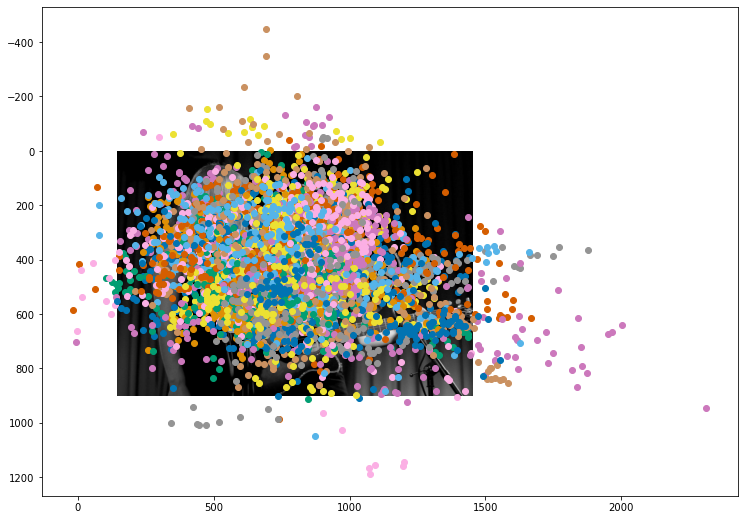

Trial_Id 4 image name i1126243635


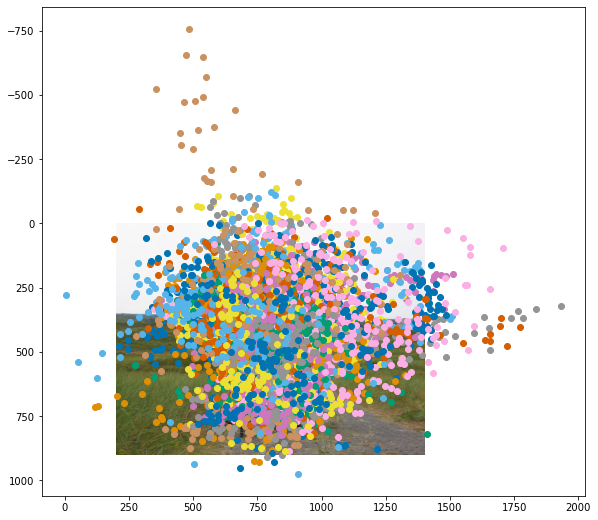

Trial_Id 5 image name i1142164052


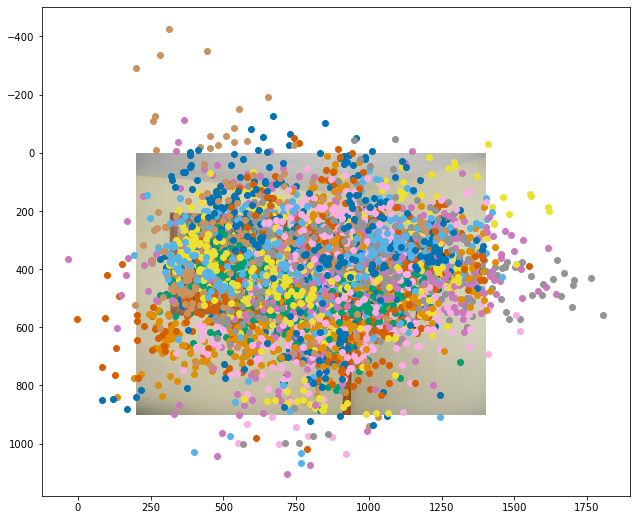

Trial_Id 6 image name i1158892521


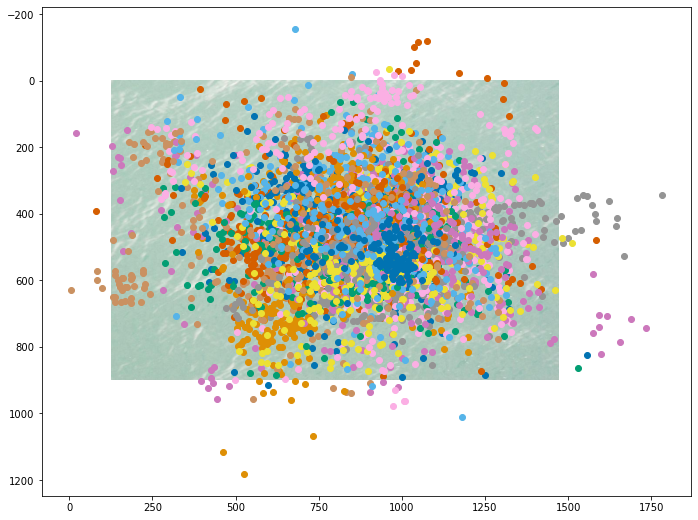

Trial_Id 7 image name i117772445


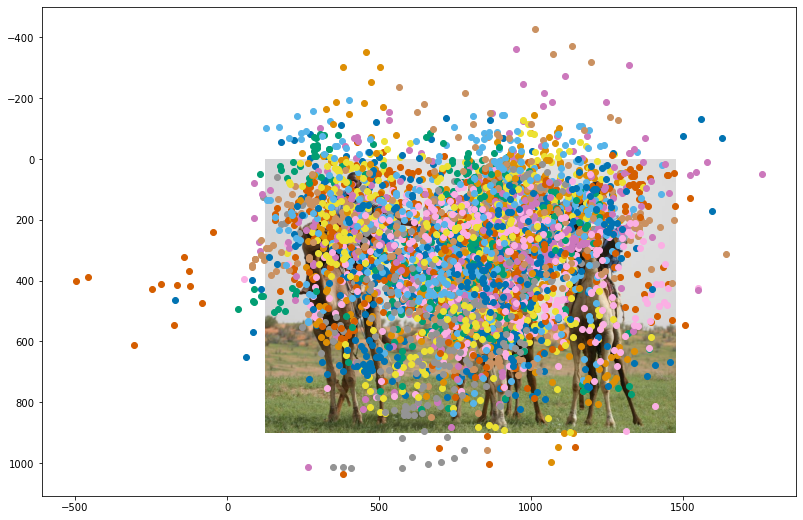

Trial_Id 8 image name i12030916


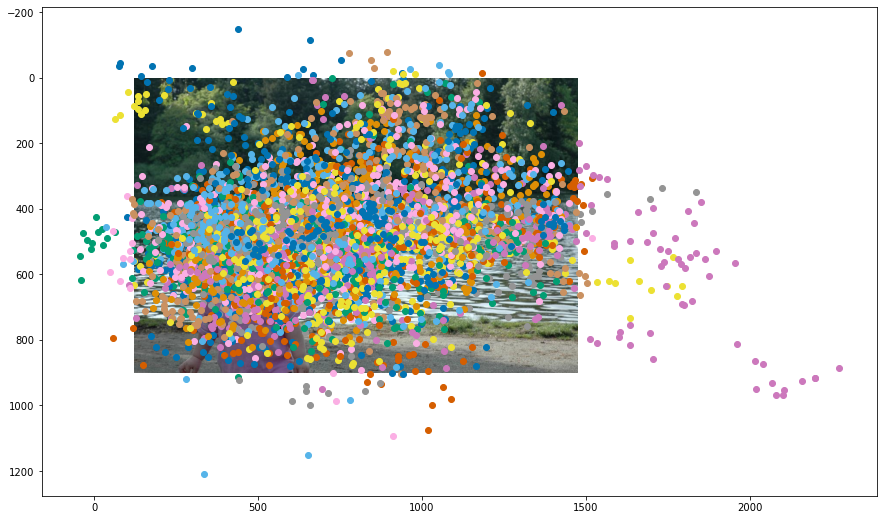

Trial_Id 9 image name i12049788


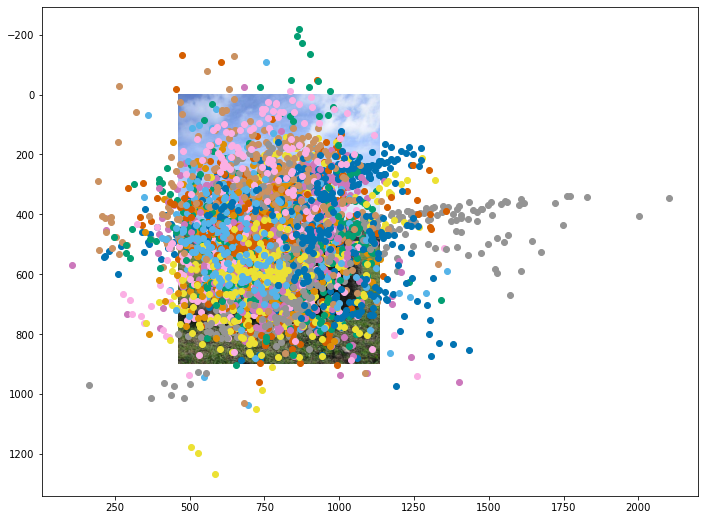

Trial_Id 10 image name i132419257


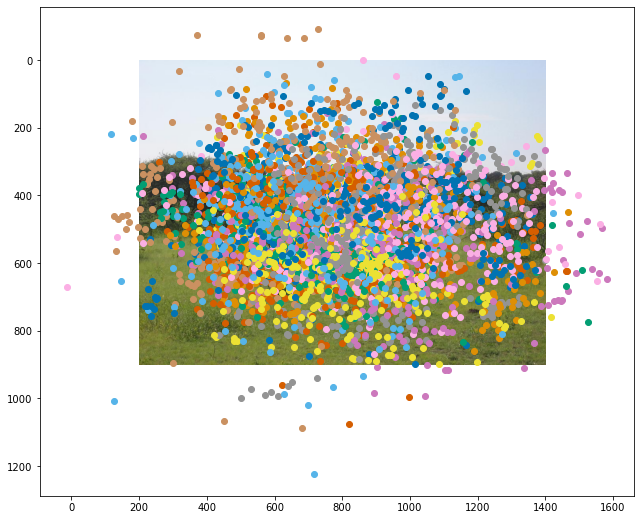

Trial_Id 11 image name i14020903


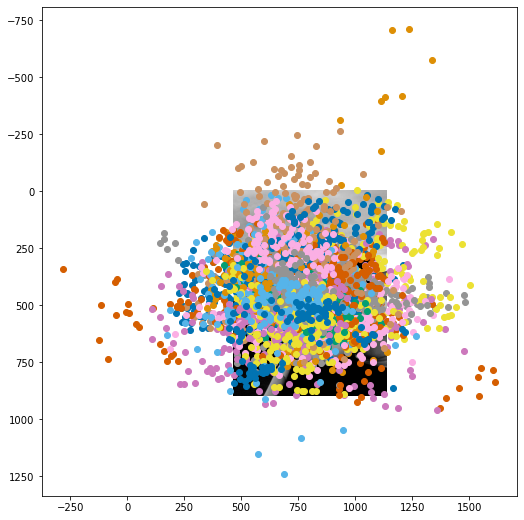

Trial_Id 12 image name i1508828


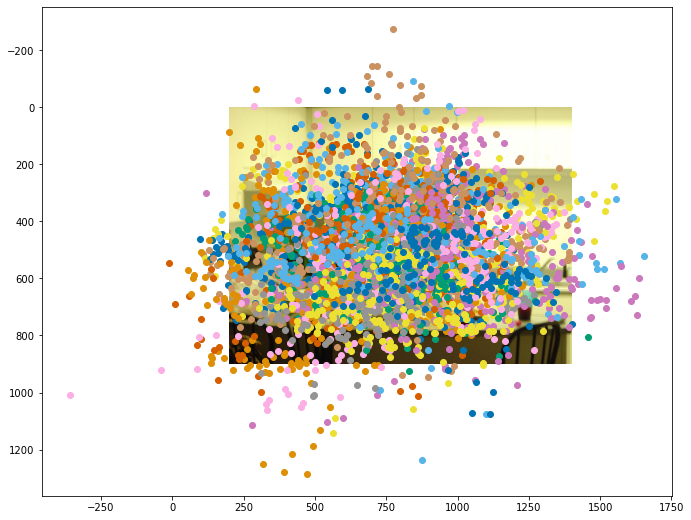

Trial_Id 13 image name i2057541


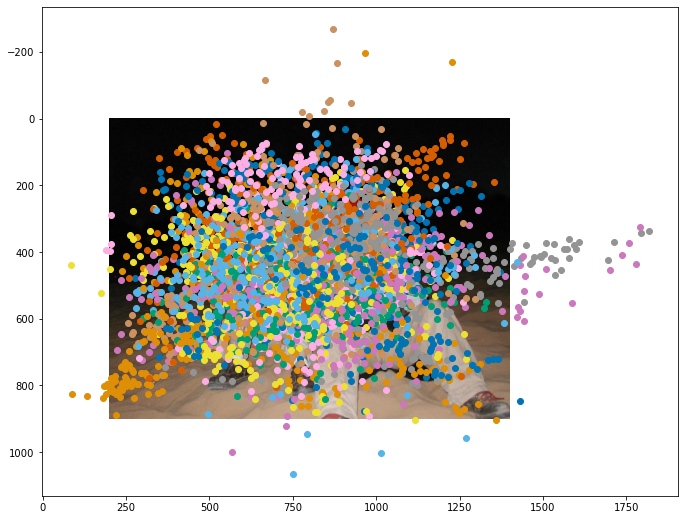

Trial_Id 14 image name i2234959271


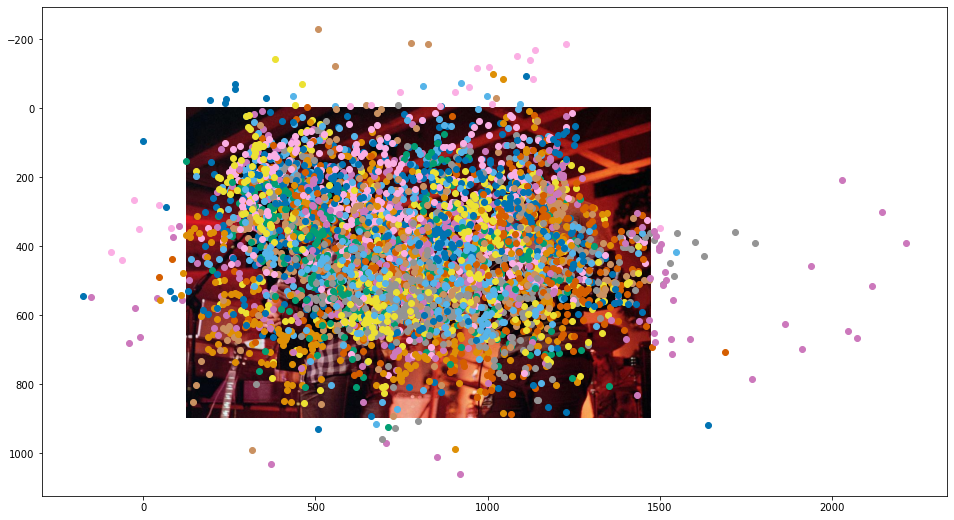

Trial_Id 15 image name i40576393


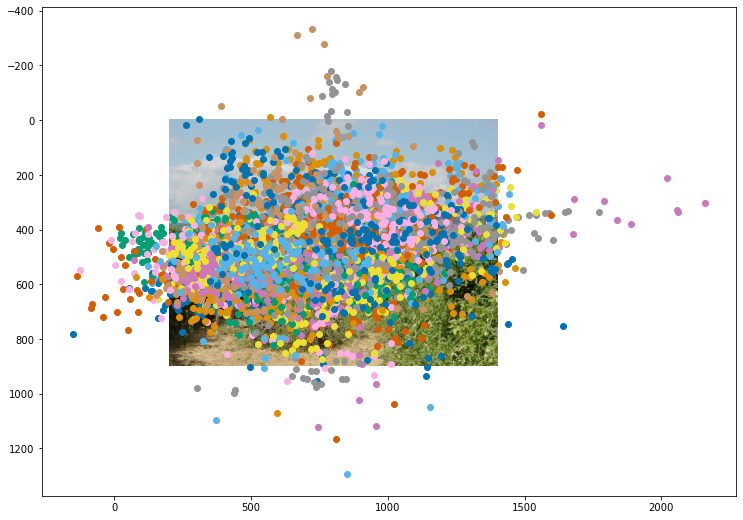

Trial_Id 16 image name i4466881


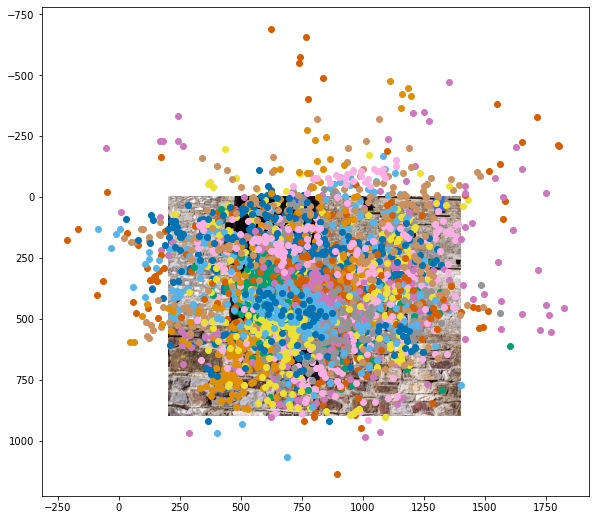

In [22]:
plot_all_subjects(FV_df[model])

In [9]:
#Using Gaussian filter instead
# import scipy
# def KDE_plot(x,y):
#     #adjust data range if needed
#     xd = x
#     yd = y

#     values = np.vstack([xd,yd])
#     kernel = scipy.stats.gaussian_kde(values)#, bw_method = 54/std_2D(x,y)) #54 fu is one degree of vis angle

#     xi, yi = np.mgrid[0:1600:1600j,0:900:900j]
#     # xi,yi = np.mgrid[xd.min():xd.max():(xd.max()-xd.min())*1j, yd.min():yd.max():(yd.max() - yd.min())*1j]
#     zi = kernel(np.vstack([xi.ravel(), yi.ravel()]))
#     Z = np.reshape(zi.T, xi.shape)
    
#     return np.flip(np.rot90(Z),0)

Trial_Id 1 image name i05june05_static_street_boston_p1010806
AUC       0.5565650662856294
CC        0.4459217112923138
SIM       0.42075067506064734


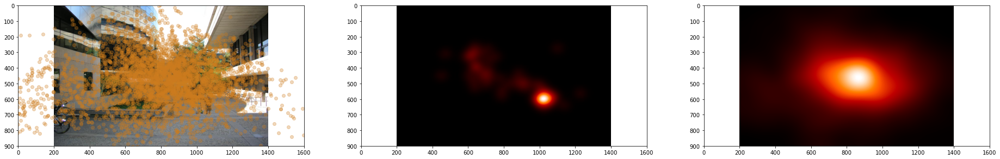

Trial_Id 2 image name i102423191
AUC       0.48691134058959784
CC        0.44401418750404964
SIM       0.3747618333733065


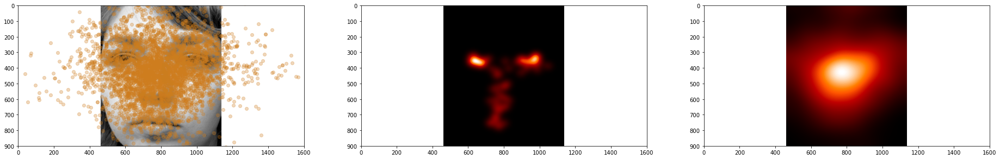

Trial_Id 3 image name i110996888
AUC       0.5006146725538296
CC        0.42328071277543833
SIM       0.3604341817536529


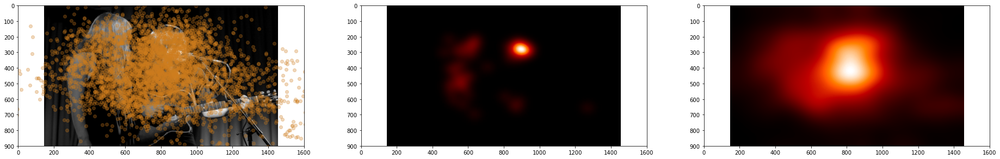

Trial_Id 4 image name i1126243635
AUC       0.5131597313136927
CC        0.5245623473474168
SIM       0.3686803917058749


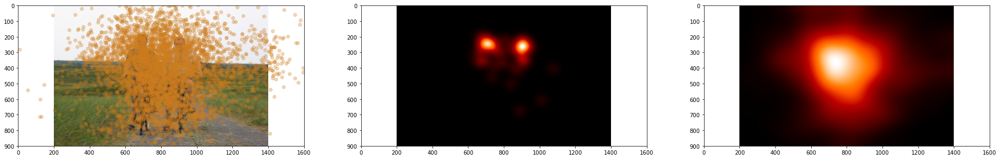

Trial_Id 5 image name i1142164052
AUC       0.47350443176844054
CC        0.4719140422173959
SIM       0.33847959313928005


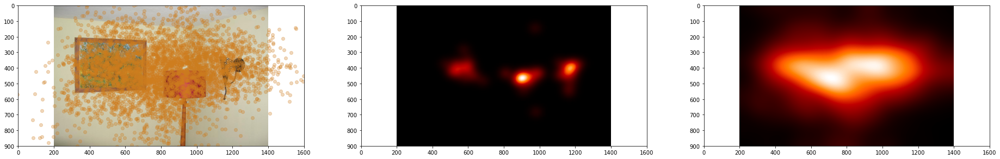

Trial_Id 6 image name i1158892521
AUC       0.5506813075700038
CC        0.6057421628696619
SIM       0.3973991846817601


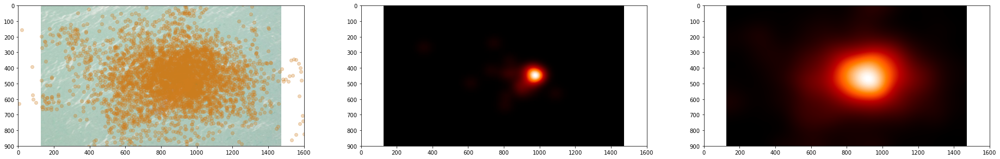

Trial_Id 7 image name i117772445
AUC       0.47669858143261856
CC        0.4616408476507521
SIM       0.36929090559361877


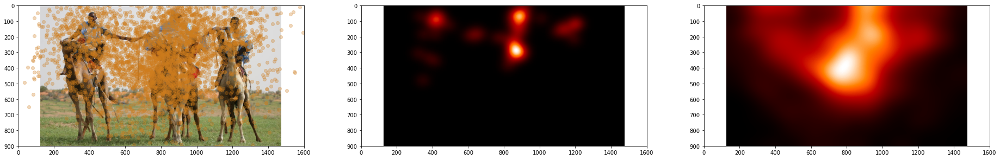

Trial_Id 8 image name i12030916
AUC       0.49060556930891885
CC        0.5880993660873236
SIM       0.3652940467563688


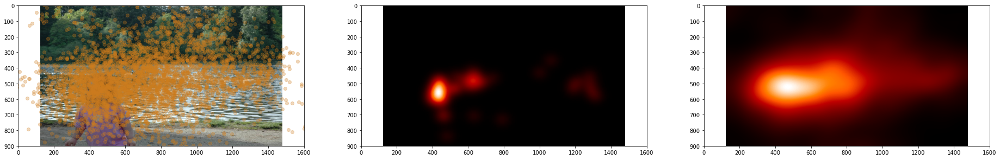

Trial_Id 9 image name i12049788
AUC       0.5132707674702724
CC        0.5184786775384497
SIM       0.3989187710054574


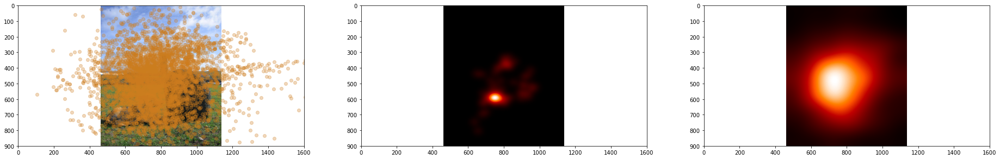

Trial_Id 10 image name i132419257
AUC       0.5046648668350047
CC        0.455552113503494
SIM       0.34656778526162335


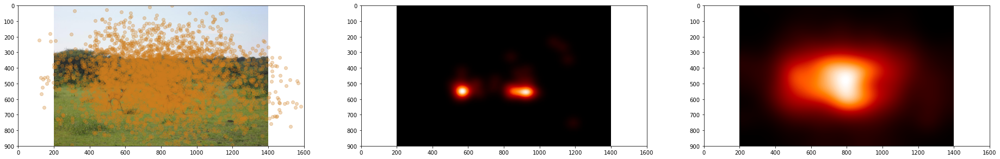

Trial_Id 11 image name i14020903
AUC       0.5010194298403972
CC        0.4246587409632713
SIM       0.38119691756931545


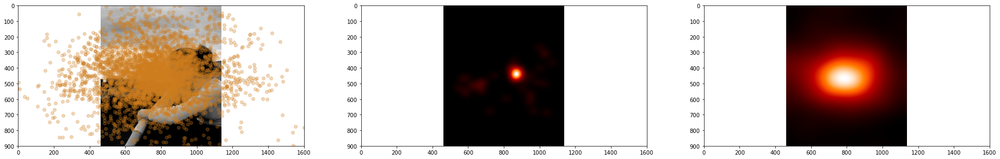

Trial_Id 12 image name i1508828
AUC       0.5062626088678099
CC        0.5217283879784568
SIM       0.41059351573703934


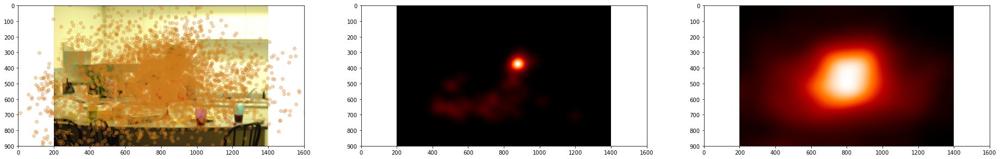

Trial_Id 13 image name i2057541
AUC       0.507929420684466
CC        0.5131781044782892
SIM       0.36164655406438456


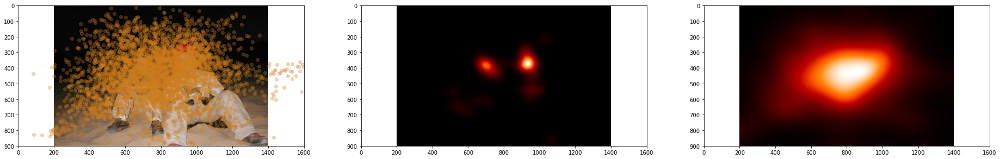

Trial_Id 14 image name i2234959271
AUC       0.49441413250126565
CC        0.37269692840889446
SIM       0.3371794981860184


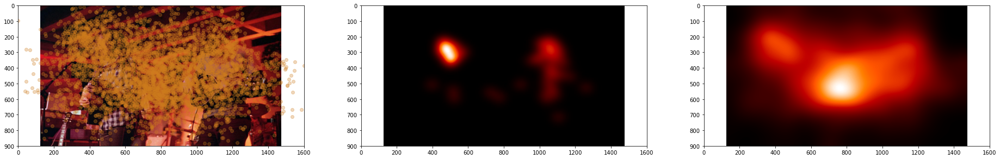

Trial_Id 15 image name i40576393
AUC       0.4463725849729553
CC        0.38063305902429095
SIM       0.34700019485183253


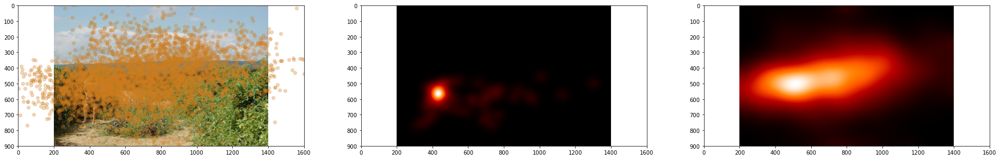

Trial_Id 16 image name i4466881
AUC       0.4400271201837601
CC        0.505716399038156
SIM       0.3263257041789349


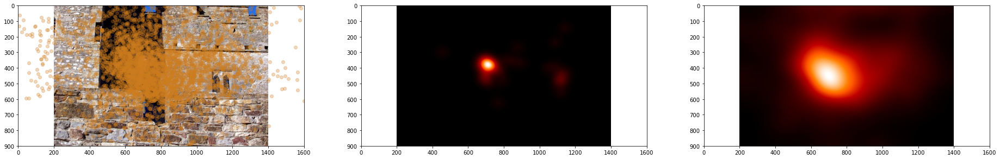

In [23]:
from scipy.ndimage import gaussian_filter
for trial in range(1,17):
    fig,ax = plt.subplots(1,3, figsize=(32,18))
    img_name = FV_IMAGES[trial]
#     palette = iter(sns.color_palette)
    print("Trial_Id", trial, "image name", img_name)
    
    #Plot image
    img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
    img,xbounds,ybounds = labVanced_present(img)
    ax[0].imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]])
    x_pts = FV_df[model].trial_x.apply(pd.Series)
    y_pts = FV_df[model].trial_y.apply(pd.Series) 
    
    #remove first 10 preds to deal with center fixation?
#     x_pts = x_pts.applymap(lambda x: x[10:])
#     y_pts = y_pts.applymap(lambda x: x[10:])
    
    for x,y in zip(x_pts[trial],y_pts[trial]): #can use different colors subjectwise
        ax[0].scatter(x,y, color = "#CE7D1E", alpha = 0.3)

    #Plot ground truth heatmap
    gt_heatmap = cv2.imread(
        "FreeView_maps/"+img_name+"_fixMap.jpg", cv2.IMREAD_GRAYSCALE)
    gt_heatmap = imutils.resize(gt_heatmap,height = 900, inter=cv2.INTER_CUBIC) #bi-cubic/nearest is what Matlab imresize() does by default
    ax[1].imshow(gt_heatmap,cmap = plt.get_cmap("gist_heat"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower")
    
    # using gaus blurring below, alternatively can also use kernel density estimation (similar results but takes much more time)
#     Z = KDE_plot(x=x_pts[trial].explode(ignore_index=True).dropna().to_list(), y=y_pts[trial].explode(ignore_index=True).dropna().to_list())
#     kde_heatmap = Z[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]]
#     ax[2].imshow(kde_heatmap,cmap = plt.get_cmap("gist_heat"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower")
# #     ax[2] = sns.kdeplot(x=pd.concat(x, ignore_index=True), y=pd.concat(y, ignore_index=True), cmap="gray", shade=True, thresh=0.5, fill = True, clip=[xbounds, ybounds])

    #Plot Predicted heatmap      
    indices = np.zeros((900,1600)) #presentation size
    indices[y_pts[trial].explode(ignore_index=True).dropna().clip(0,indices.shape[0]-1).to_list(),x_pts[trial].explode().dropna().clip(0,indices.shape[1]-1).to_list()] = 1 #marking gazepoints
    indices = indices[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]] #cropping to image size (removing padding)
    pred_heatmap = gaussian_filter(indices,sigma=54)*255  #Sigma = 1 visual degree (54 fu)
    ax[2].imshow(pred_heatmap, cmap = plt.get_cmap("gist_heat"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin = "lower")
                      
    print("{:10}{}".format("AUC",AUC_Judd(gt_heatmap,indices)))
    print("{:10}{}".format("CC",CC(gt_heatmap, pred_heatmap)))
    print("{:10}{}".format("SIM",SIM(gt_heatmap, pred_heatmap)))
    
    for i in range(3):
        ax[i].set_xlim(0,1600)
        ax[i].set_ylim(0,900)
        ax[i].invert_yaxis()
        ax[i].set_aspect(14/16)
#     plt.gca().invert_yaxis()
    plt.show()
    
# ax.set_frame_on(False)
# # fig.savefig('kde.png', transparent=True, bbox_inches='tight', pad_inches=0)

### Test

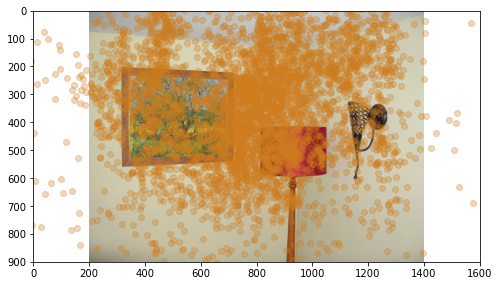

In [383]:
#Plot all gaze points
img_name = FV_IMAGES[5]
img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
img,xbounds,ybounds = labVanced_present(img)
plt.figure(figsize=(8,6))
plt.xlim(0,1600)
plt.ylim(0,900)
plt.gca().invert_yaxis()
plt.imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]])

x_pts = FV_df_eth.trial_x.apply(pd.Series)
y_pts = FV_df_eth.trial_y.apply(pd.Series) 
for x,y in zip(x_pts[7],y_pts[7]): #can use different colors subjectwise
    plt.scatter(x,y, color = "#CE7D1E", alpha = 0.3)

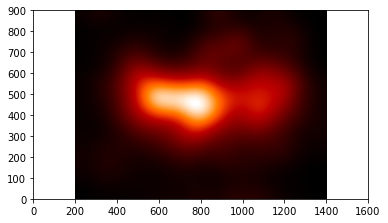

In [384]:
#Using Gaussian blur
from scipy.ndimage import gaussian_filter
arr = np.zeros((900,1600)) #presentation size
arr[pd.to_numeric(y_pts[5].explode(ignore_index=True)).dropna().clip(0,arr.shape[0]-1).to_list(),pd.to_numeric(x_pts[5].explode(ignore_index=True)).dropna().clip(0,arr.shape[1]-1).to_list()] = 1 #marking gazepoints
arr = arr[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]] #cropping to image size (removing padding)
blur = gaussian_filter(arr,sigma=54)*255
plt.xlim(0,1600)
plt.ylim(0,900)
plt.imshow(blur, cmap = plt.get_cmap("gist_heat"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]])

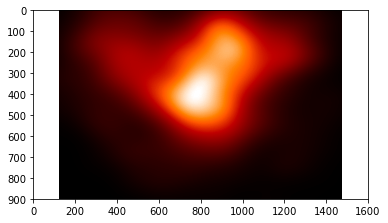

In [599]:
#plotting KDE
# Z = KDE_plot(x=x_pts[7].explode(ignore_index=True).dropna().to_list(), y=y_pts[7].explode(ignore_index=True).dropna().to_list())
# kde_heatmap = Z[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]]
plt.xlim(0,1600)
plt.ylim(0,900)
plt.imshow(kde_heatmap,cmap = plt.get_cmap("gist_heat"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower")
plt.gca().invert_yaxis()

# Blinks

In [27]:
from analysis_blinks import *

In [35]:
blink_analyse = Blink_Detect("s8")

Trial_Id                                                                2
beep_times              "times=1635887945620;1635887947066;16358879485...
beepEndTimes            "times=1635887945620;1635887947246;16358879486...
BlinkRec                     blockNr_13_taskNr_15_trialNr_1_BlinkRec.webm
Condition_Id                                                            1
did_leave_fullscreen                                                  0.0
FrameEnd                                                  1635887959338.0
FrameStart                                                1635887945688.0
iter                    "times=1635887945620;1635887947248;16358879486...
next_time               "times=1635887945691;1635887947246;16358879486...
random                  "times=1635887945620;1635887945690;16358879472...
RecStart                                                              2.0
Name: 7, dtype: object
blinks_df summary 
 None


Recording Name :  blockNr_13_taskNr_15_trialNr_1_BlinkRec.webm
Recording length :  12.972000
RecStop - RecStart :  13022.0
Frame Count :  395
FPS :  0.030333282137920442
start times :  [1376, 2810, 4481, 6208, 7835, 9398, 10824]
inter-beat duration :  [1434, 1671, 1727, 1627, 1563, 1426]
Latency:  [15, 9, 9, 9, 9, 8, 10]


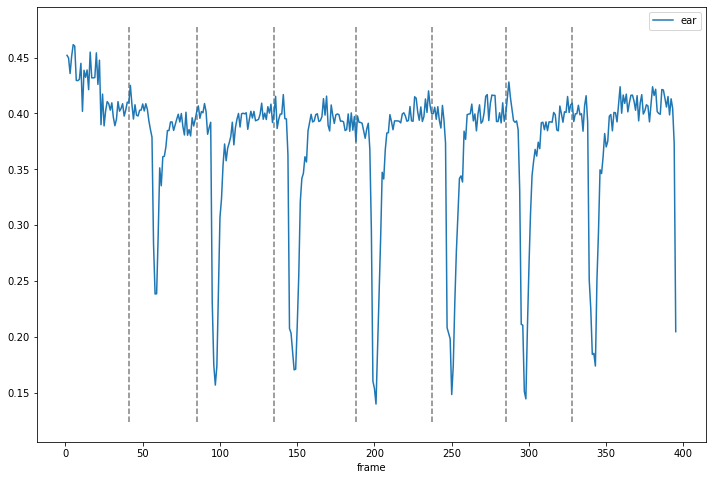

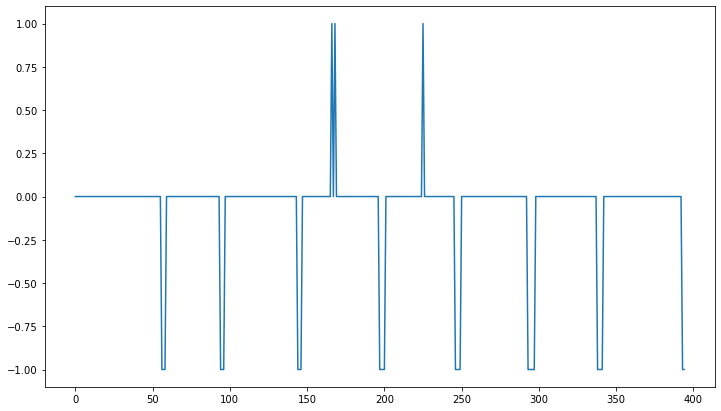

--------------------------------------------------
Recording Name :  blockNr_13_taskNr_15_trialNr_2_BlinkRec.webm
Recording length :  12.582000
RecStop - RecStart :  12698.0
Frame Count :  384
FPS :  0.03024098283194204
start times :  [1352, 2773, 4449, 6124, 7680, 9096, 10485]
inter-beat duration :  [1421, 1676, 1675, 1556, 1416, 1389]
Latency:  [14, 2, 1, 1, 8, 11, 10]


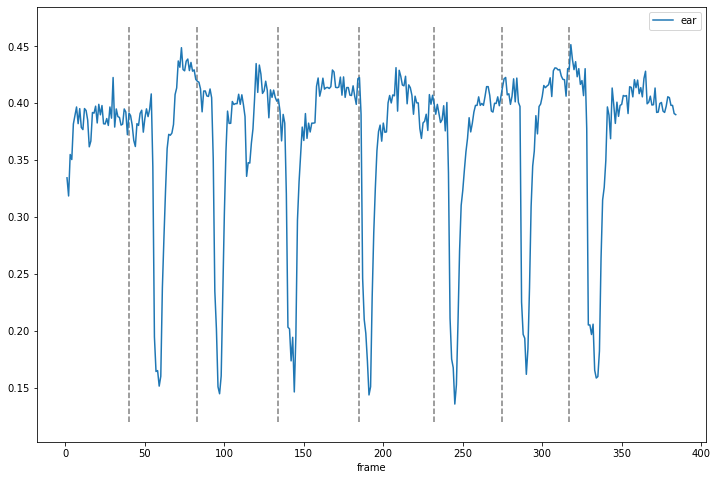

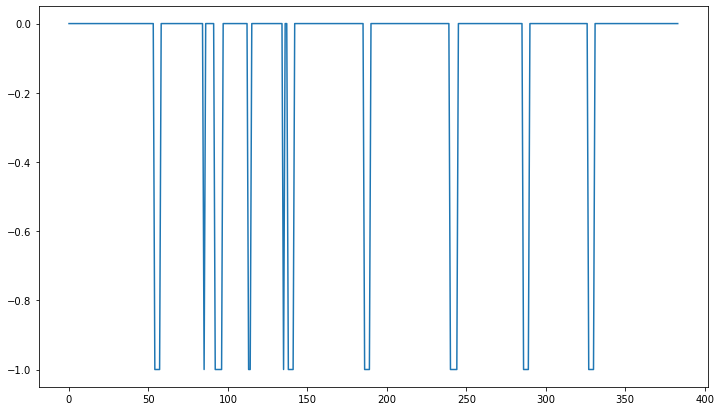

--------------------------------------------------
Recording Name :  blockNr_13_taskNr_15_trialNr_3_BlinkRec.webm
Recording length :  12.793000
RecStop - RecStart :  12911.0
Frame Count :  390
FPS :  0.03020680040275734
start times :  [1305, 2715, 4501, 6093, 7626, 9058, 10726]
inter-beat duration :  [1410, 1786, 1592, 1533, 1432, 1668]
Latency:  [8, 8, 9, 7, 6, 9, 12]


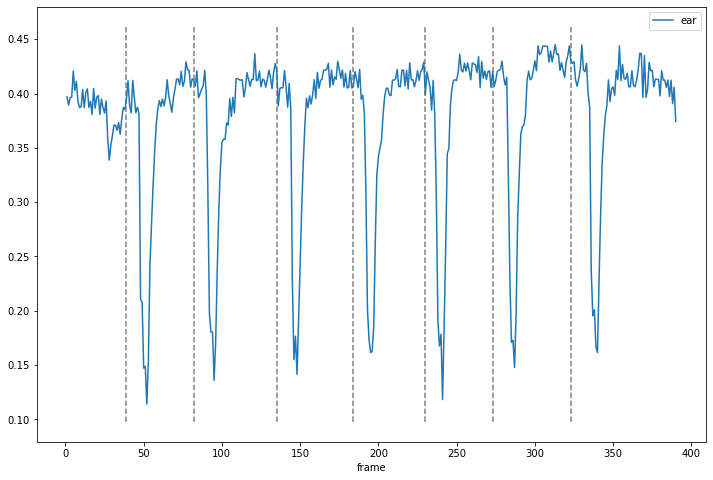

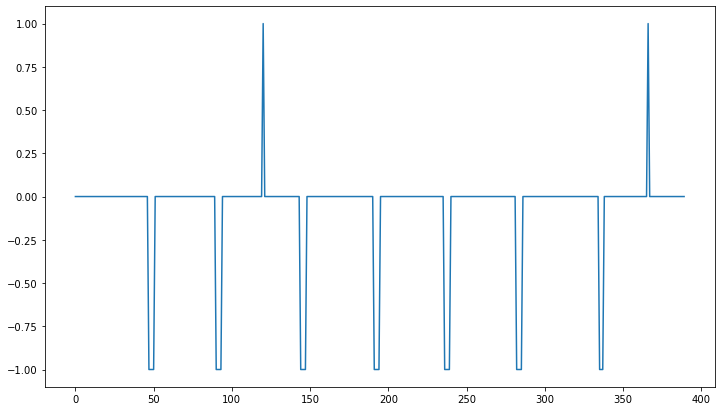

--------------------------------------------------
Recording Name :  blockNr_13_taskNr_15_trialNr_4_BlinkRec.webm
Recording length :  12.820000
RecStop - RecStart :  12890.0
Frame Count :  389
FPS :  0.030178432893716058
start times :  [1469, 2914, 4579, 6337, 7730, 9290, 10707]
inter-beat duration :  [1445, 1665, 1758, 1393, 1560, 1417]
Latency:  [5, 1, 10, 9, 10, 9, 11]


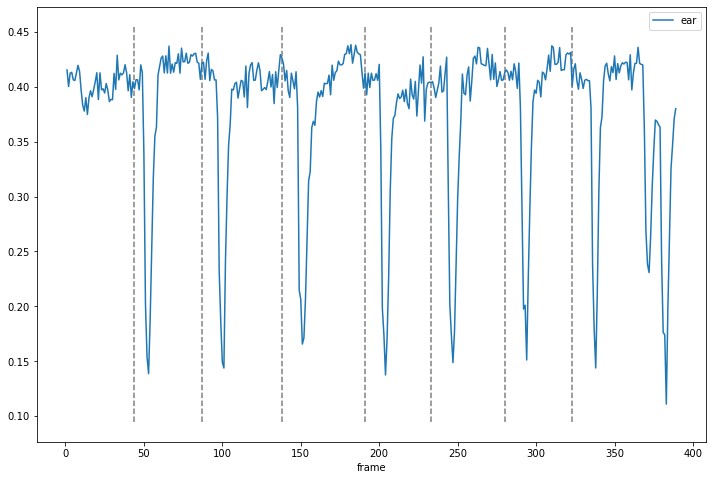

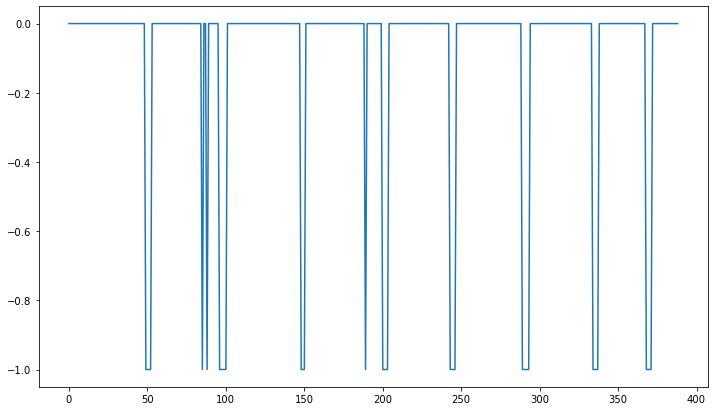

--------------------------------------------------
Recording Name :  blockNr_13_taskNr_15_trialNr_5_BlinkRec.webm
Recording length :  12.806000
RecStop - RecStart :  12876.0
Frame Count :  385
FPS :  0.029900590245417833
start times :  [1289, 2761, 4300, 6001, 7417, 9073, 10681]
inter-beat duration :  [1472, 1539, 1701, 1416, 1656, 1608]
Latency:  [2, 7, 6, 2, 6, 6, 9]


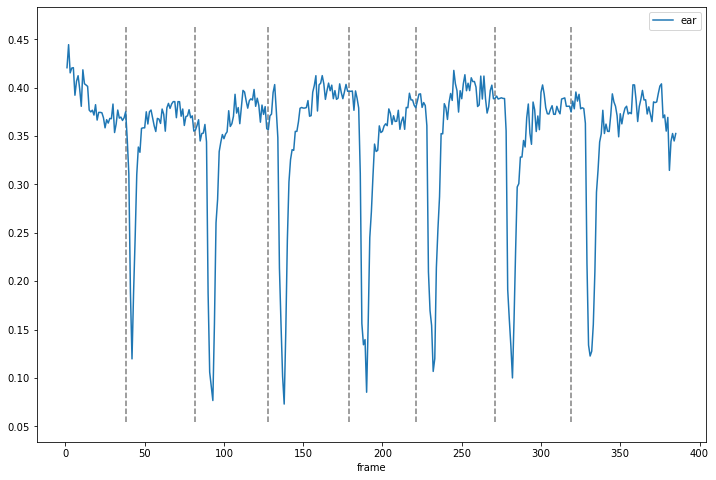

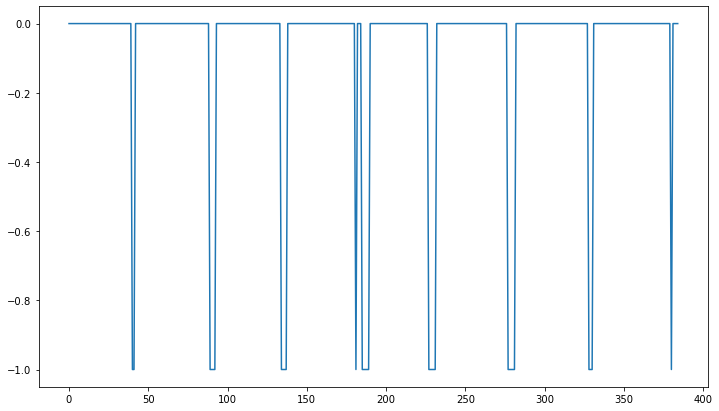

--------------------------------------------------
Recording Name :  blockNr_6_taskNr_15_trialNr_1_BlinkRec.webm
Recording length :  12.381000
RecStop - RecStart :  12436.0
Frame Count :  377
FPS :  0.030315213895143134
start times :  [1374, 2834, 4252, 5860, 7257, 8798, 10245]
inter-beat duration :  [1460, 1418, 1608, 1397, 1541, 1447]
Latency:  [12, 10, 9, 9, 9, 10, 10]


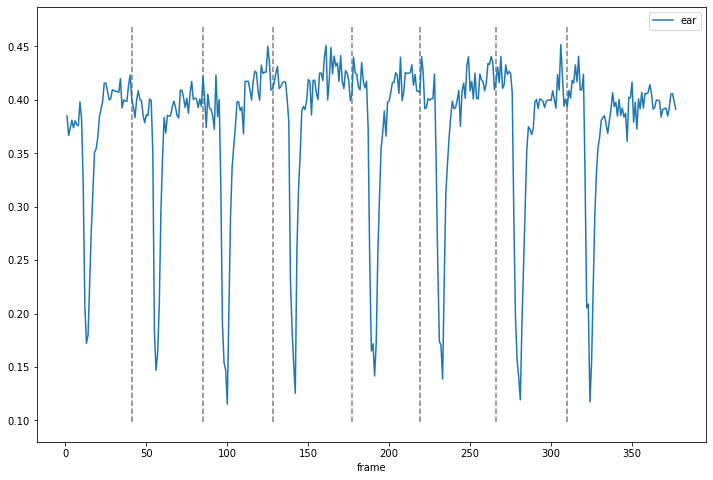

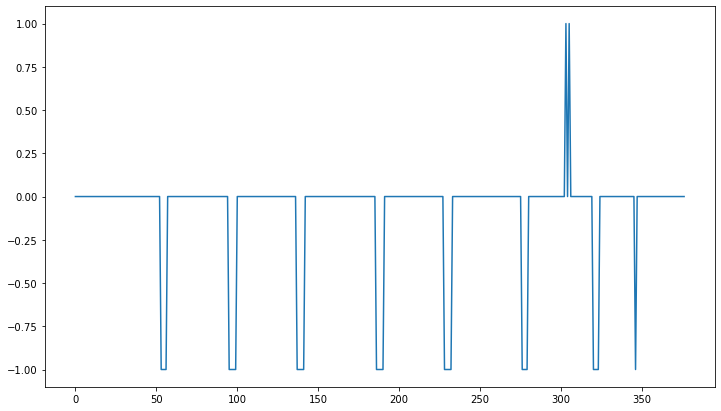

--------------------------------------------------
Recording Name :  blockNr_6_taskNr_15_trialNr_2_BlinkRec.webm
Recording length :  13.210000
RecStop - RecStart :  13284.0
Frame Count :  403
FPS :  0.030337247816922614
start times :  [1323, 2777, 4554, 6252, 7874, 9325, 11090]
inter-beat duration :  [1454, 1777, 1698, 1622, 1451, 1765]
Latency:  [12, 4, 8, 8, 9, 9, 13]


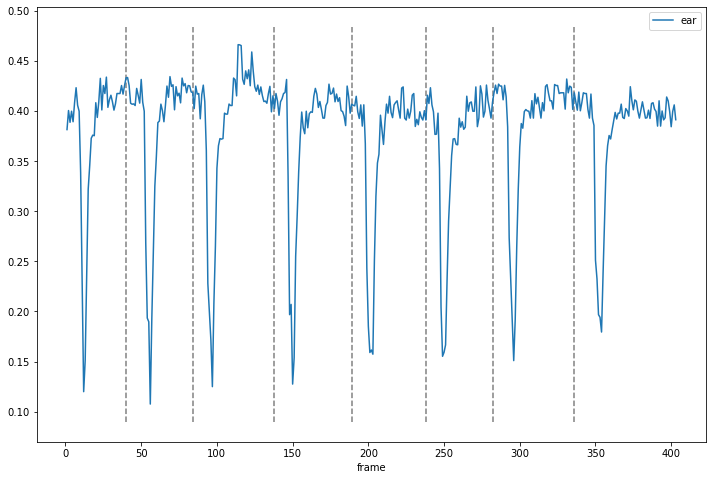

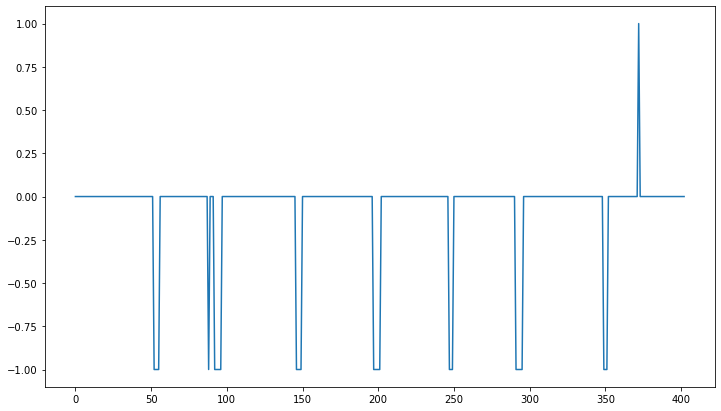

--------------------------------------------------
Recording Name :  blockNr_6_taskNr_15_trialNr_3_BlinkRec.webm
Recording length :  13.246000
RecStop - RecStart :  13322.0
Frame Count :  404
FPS :  0.030325776910373817
start times :  [1414, 2964, 4737, 6517, 7929, 9663, 11150]
inter-beat duration :  [1550, 1773, 1780, 1412, 1734, 1487]
Latency:  [13, 5, 0, 9, 10, 0, 9]


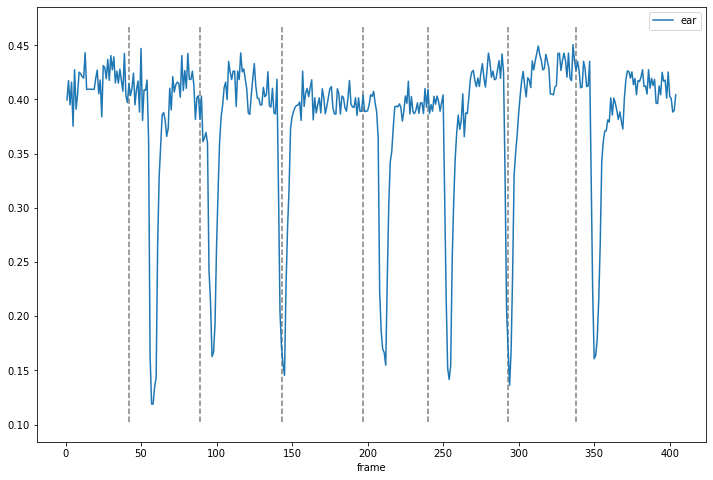

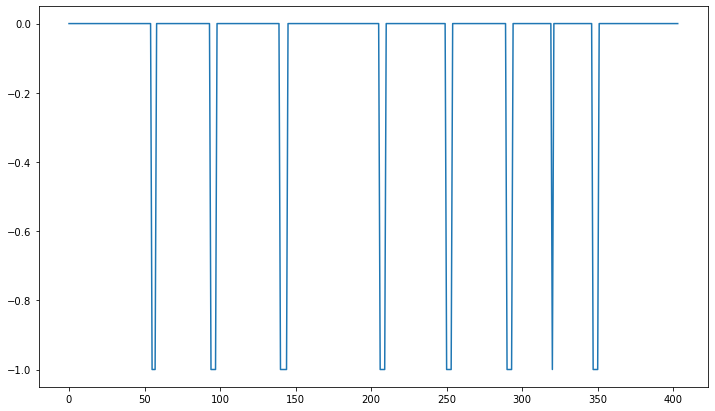

--------------------------------------------------
Recording Name :  blockNr_6_taskNr_15_trialNr_4_BlinkRec.webm
Recording length :  13.105000
RecStop - RecStart :  13140.0
Frame Count :  395
FPS :  0.030060882800608826
start times :  [1564, 3232, 4822, 6200, 7733, 9213, 10957]
inter-beat duration :  [1668, 1590, 1378, 1533, 1480, 1744]
Latency:  [11, 9, 9, 8, 8, 8, 9]


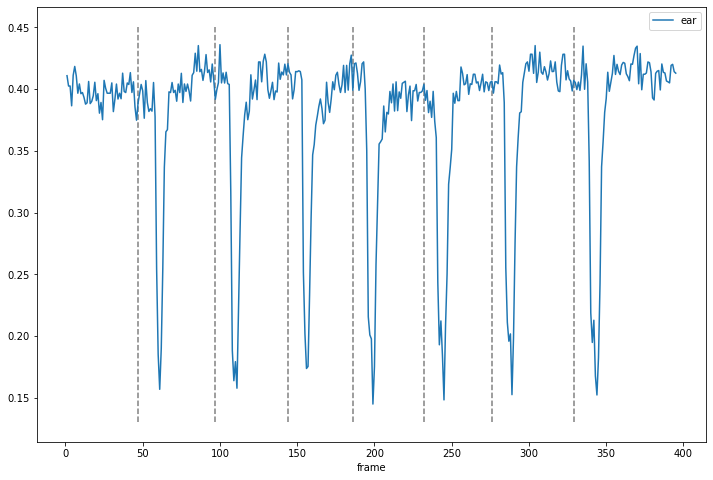

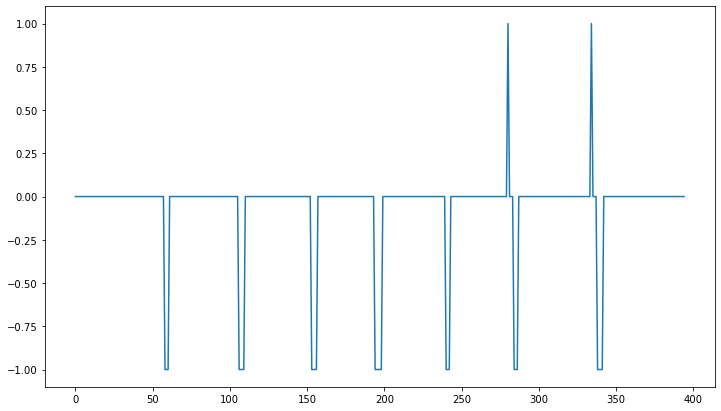

--------------------------------------------------
Recording Name :  blockNr_6_taskNr_15_trialNr_5_BlinkRec.webm
Recording length :  13.054000
RecStop - RecStart :  13129.0
Frame Count :  398
FPS :  0.030314570797471248
start times :  [1582, 3213, 4883, 6354, 7914, 9514, 10950]
inter-beat duration :  [1631, 1670, 1471, 1560, 1600, 1436]
Latency:  [8, 7, 8, 9, 8, 6, 9]


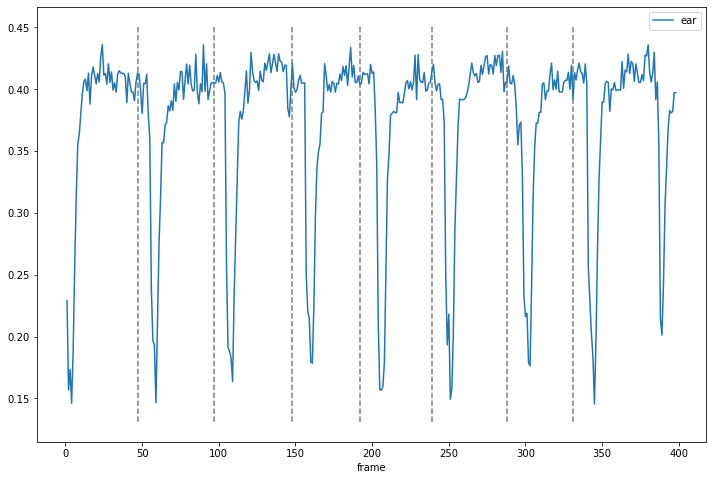

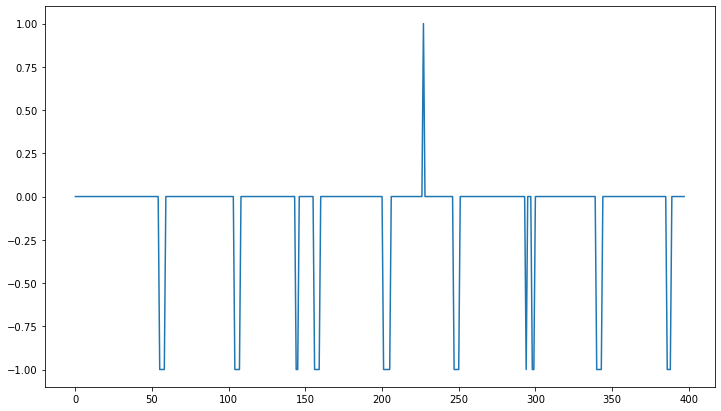

--------------------------------------------------


In [39]:
#test
model = pred_path.EAR
preds = blink_analyse.parse_trials_stack(model)

In [40]:
#test
lengths = [len(t[~np.isnan(t)]) for t in ear_preds.values()]
print(f"number of blinks detected in each trial: {lengths}")
print("Avg blinks/trial: ",statistics.mean(lengths))
t = np.concatenate(list(ear_preds.values()))
print("Avg latency: ",np.mean(t[~np.isnan(t)])/0.030)

number of blinks detected in each trial: [7, 7, 7, 7, 7, 7, 7, 7, 7, 7]
Avg blinks/trial:  7
Avg latency:  560.4761904761905


In [41]:
#test
l = [len(i) for i in ear_preds.values()]
sum(l)/len(l)

7.0

## model wise

In [43]:
model = pred_path.EAR
subjects = os.listdir(model.value)
blink_df_ear = subject_wise_blinks(subjects,model)

100%|███████████████████████████████████████████| 41/41 [01:30<00:00,  2.20s/it]


In [45]:
model = pred_path.RT_BENE
subjects = os.listdir(model.value)
blink_df_rt_bene = subject_wise_blinks(subjects,model)

100%|███████████████████████████████████████████| 41/41 [01:30<00:00,  2.21s/it]


In [ ]:
blink_df = {pred_path.EAR: blink_df_ear, pred_path.RT_BENE: blink_df_rt_bene}
model = pred_path.RT_BENE


win_sub_blinks_per_trial = winsorize(blink_df[model]["avg_blinks/trial"], limits=[0.1,0.1]).mean()
win_sub_avg_latency = winsorize(blink_df[model]["avg_latency"], limits=[0.1,0.1]).mean()

In [ ]:
print("Avg blinks per trial: ", win_sub_blinks_per_trial)
print("Avg blink latency: ", win_sub_avg_latency)